# <h1><center> **Audio Visualization, Prediction and Recommendation System**</center></h1>

# Overview
* Audio Visualization
* Audio Classification
* Audio Recommendation

In [ ]:
#mounting the drive so that we can fetch data from google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Importing the libraries

* pandas is the most powerful and flexible open source data analysis/manipulation tool available in any language
* Using NumPy, mathematical and logical operations on arrays can be performed.
* Seaborn is an open-source Python library built on top of matplotlib. It is used for data visualization and exploratory data analysis. Seaborn works easily with dataframes and the Pandas library. The graphs created can also be customized easily.
* TensorFlow is an end-to-end open source platform for machine learning. It has a comprehensive, flexible ecosystem of tools, libraries and community resources that lets researchers push the state-of-the-art in ML and developers easily build and deploy ML powered applications.


In [ ]:
# Import required libraries
# import pandas for data analysing
import pandas as pd

# import numpy to solve mathematical operations
import numpy as np


# import seaborn to do data visualization
import seaborn as sns

# import matplotlib to plot different mathematical graphs and plots

import matplotlib.pyplot as plt
# import tensorflow to perform ML processes
import tensorflow as tf

# use %matplotlib inline to use matplotlib in jupyter notebook and colab
%matplotlib inline

# import sklearn to perform ML
import sklearn


* Using **librosa** as a audio processing library.
* [**librosa**](https://librosa.org/doc/latest/core.html#module-librosa) is a python package for music and audio analysis. It provides the building blocks necessary to create music information retrieval systems.

In [ ]:
# importing the librosa library
import librosa
import librosa.display

# import librosa.display to display audio as a waves


# import IPython.display as ipd, which  lets you play audio directly in an IPython notebook
import IPython.display as ipd

# import warnings- Warnings are provided to warn the developer of situations that aren't necessarily exceptions.
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# move to the folder where you want to store the project
%cd /content/extracted_sounds

/content/extracted_sounds


* Using **librosa** as a audio processing library.
* [**librosa**](https://librosa.org/doc/latest/core.html#module-librosa) is a python package for music and audio analysis. It provides the building blocks necessary to create music information retrieval systems.

* Using **librosa** as a audio processing library.
* [**librosa**](https://librosa.org/doc/latest/core.html#module-librosa) is a python package for music and audio analysis. It provides the building blocks necessary to create music information retrieval systems.

In [ ]:
# Unzip the dataset and then comment out this line
#!unzip "/content/drive/MyDrive/Colab Notebooks/Music recommendation system/music /GTZAN_dataset.zip"
import zipfile
with zipfile.ZipFile("/content/drive/MyDrive/archive (8).zip", 'r') as zip_ref:
    zip_ref.extractall("/content/extracted_sounds")

#Finding all the classes in our train dataset

In [ ]:
import os


# move to folder where your data is stored , set location of data in general path
general_path = "/content/extracted_sounds/Data"  # Update with the actual dataset path

# Step 3: Print all the classes (genres) in the dataset
genre_path = f"{general_path}/genres_original/"  # Folder where genres are stored
if os.path.exists(genre_path):
    genres = os.listdir(genre_path)
    print("Genres available in the dataset:", genres)
else:
    print("Error: Dataset path does not exist!")# your path

# print all the classes using os.listdir you have in the dataset using f'{general_path}/genres_original/'


Genres available in the dataset: ['blues', 'rock', 'jazz', 'classical', 'country', 'disco', 'pop', 'metal', 'reggae', 'hiphop']


# Audio Preprocessing

In [ ]:
# Importing 1 sample file(Subject: Request for Access to NASSCOM Assessment, for audio visualization
audio_file_path ='/content/extracted_sounds/Data/genres_original/disco/disco.00002.wav' # path

#  Load the audio as a waveform `y` using librosa.load
#  Store the sampling rate as `sr`
y,sr = librosa.load(audio_file_path,sr=22050)# code here

# print y, y.shape and sr
print('y:',y)

print('y shape:',y.shape)
print('sample rate:',sr)

# Verify length of the audio (y.shape/sample rate)
print('check len of audio:',len(audio_file_path))


y: [0.09420776 0.09906006 0.0581665  ... 0.05667114 0.04855347 0.10333252]
y shape: (661794,)
sample rate: 22050
check len of audio: 68



* for removing noise in corner cases i.e begining and end of actual audio.

In [ ]:
# Trim leading and trailing silence from an audio signal (silence before and after the actual audio)
audio_file, _ = librosa.effects.trim(y)# code here

# the result is an numpy ndarray, print audio_file
print(audio_file)

# print shape of audio
print(audio_file.shape)



[0.09420776 0.09906006 0.0581665  ... 0.05667114 0.04855347 0.10333252]
(661794,)


[librosa.display.waveplot](https://librosa.org/doc/latest/generated/librosa.display.waveplot.html#librosa.display.waveplot)
* Plot the amplitude envelope of a waveform.

* If y is monophonic, a filled curve is drawn between [-abs(y), abs(y)].

* If y is stereo, the curve is drawn between [-abs(y[1]), abs(y[0])], so that the left and right channels are drawn above and below the axis, respectively.

* Long signals (duration >= max_points) are down-sampled to at most max_sr before plotting.

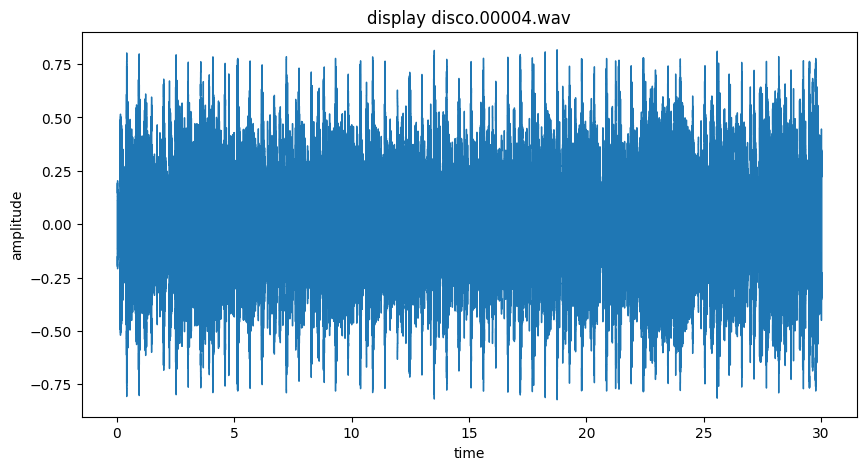

In [ ]:
# set graph size using plt.figure
plt.figure(figsize=(10, 5))

#Plot the amplitude envelope of a waveform using librosa.display.waveplot
librosa.display.waveshow(y,sr=sr)
plt.xlabel('time')
plt.ylabel('amplitude')
plt.title('display disco.00004.wav')
plt.show()
# plot the title of sound wave



In [ ]:
# import wavfile as wav from scipy.io
from scipy.io import wavfile

# Open a WAV file(use audio_file_path)
# Return the sample rate (in samples/sec) and data from an LPCM WAV file.
wave_sample_rate, wave_audio = wavfile.read(audio_file_path)# code here
wave_audio

array([3087, 3246, 1906, ..., 1857, 1591, 3386], dtype=int16)

Text(0.5, 1.0, 'sound waves in disco 00004')

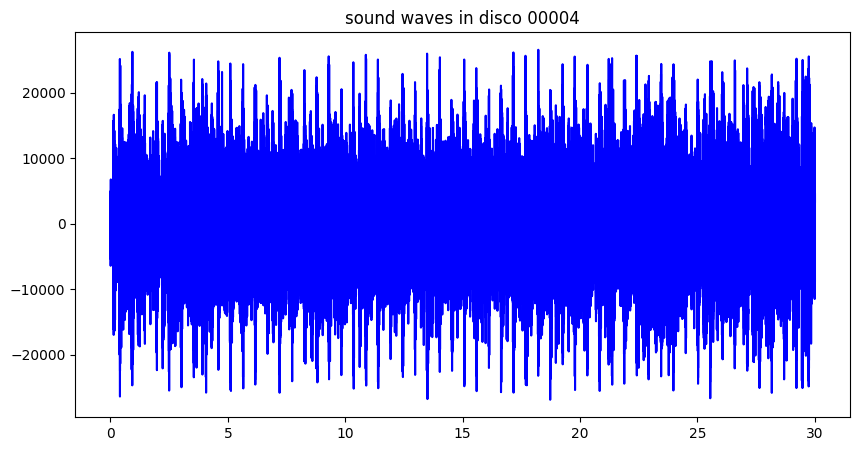

In [ ]:
# set figure size
plt.figure(figsize=(10,5))

# plot the audio as a wave graph
time = np.linspace(0, len(wave_audio) / sr, num=len(wave_audio))
plt.plot(time, wave_audio, color='blue')
plt.title('sound waves in disco 00004')

# plot the title of graph


# **Fourier Transformation( using Short Time Fourier Transform STFT)**

## **1. Fourier Transform**
* Decompose complex periodic sound into sum of sine waves oscillating at
different frequencies
* From time domain to frequency domain
* No time information

<a href="https://ibb.co/SnB9xyD"><img src="https://i.ibb.co/xj6RsLK/1.jpg" alt="1" border="0"></a>

Note:- The "Fast Fourier Transform" (FFT) is an important measurement method in the science of audio and acoustics measurement. It converts a signal into individual spectral components and thereby provides frequency information about the signal.

## **2. Short-time Fourier transform (STFT)**
[Short-time Fourier transform (STFT)](http://librosa.org/doc/main/generated/librosa.stft.html).

* The STFT represents a signal in the time-frequency domain by computing discrete Fourier transforms (DFT) over short overlapping windows.
* Computes several FFT at different intervals
* Preserves time information
* Fixed frame size (e.g., 2048 samples)
* Gives a spectrogram (time + frequency + magnitude)

**Step 1**<br><a href="https://ibb.co/Jq06v1K"><img src="https://i.ibb.co/68V9HMm/2.jpg" alt="2" border="0"></a>

**Step 2**
<br>
<a href="https://ibb.co/1qNQxht"><img src="https://i.ibb.co/wWqg13F/3.jpg" alt="3" border="0"></a>

In [ ]:
# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns (looks like a good default)

# set abs value of librosa.stft and pass audio_file, n_fft and hop_length (Short-time Fourier transform (STFT))
D =  np.abs(librosa.stft(audio_file, n_fft=n_fft, hop_length=hop_length))# code here

# print shape of D
print("Shape of D:", D.shape)


Shape of D: (1025, 1293)


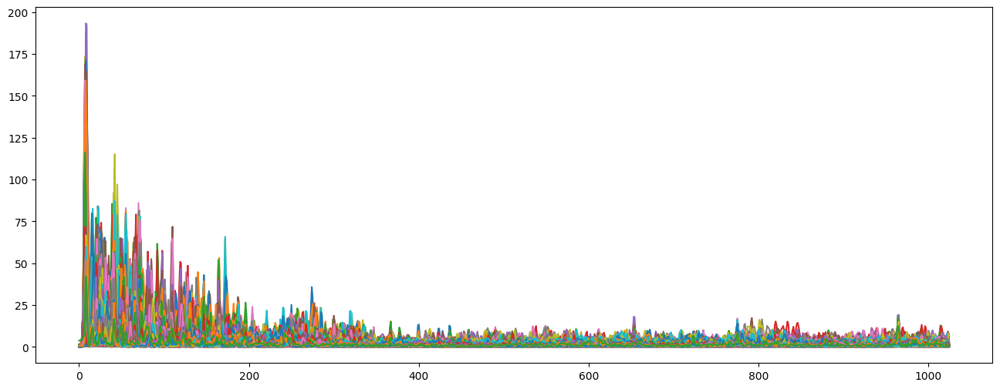

In [ ]:
# plot D
plt.figure(figsize = (16, 6))
plt.plot(D);

#**Spectrogram**

A spectrogram is a visual way of representing the signal strength, or “loudness”, of a signal over time at various frequencies present in a particular waveform.

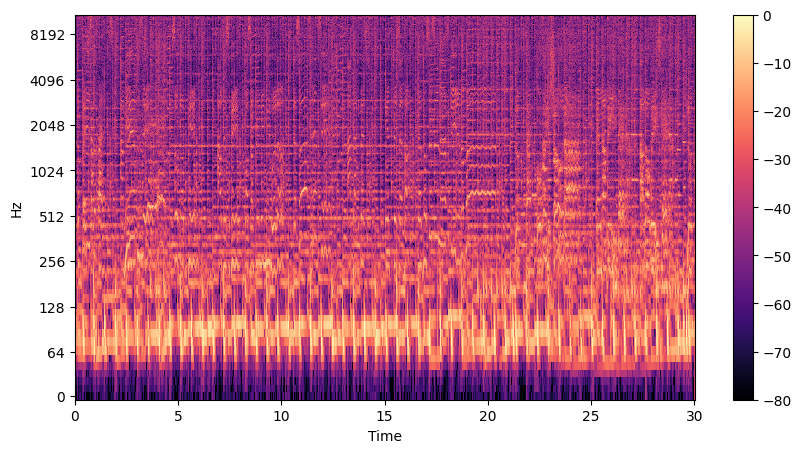

In [ ]:
# Convert an amplitude spectrogram to Decibels-scaled spectrogram. i.e. use librosa.amplitude_to_db
DB = librosa.amplitude_to_db(D, ref=np.max)# code

# Creating the Spectogram, use library.display.specshow
plt.figure(figsize=(10, 5))  # Set figure size
librosa.display.specshow(DB, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log')




# The colorbar() function in pyplot module of matplotlib adds a colorbar to a plot indicating the color scale.
plt.colorbar();

#Mel Spectrogram

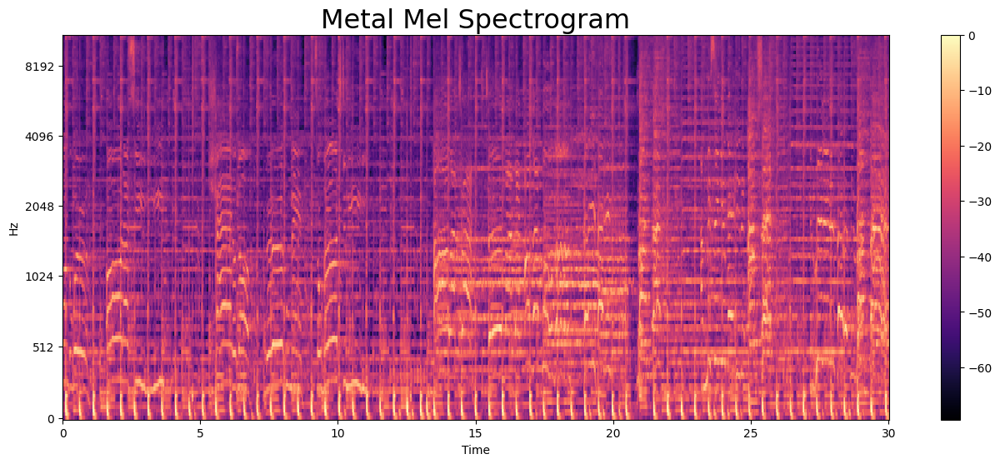

In [ ]:
# load the dataset path, hint - f'{general_path}/genres_original/disco/disco.00004.wav'
y, sr = librosa.load(f'{general_path}/genres_original/disco/disco.00004.wav',sr=22050)# code here

# Trim leading and trailing silence from an audio signal (silence before and after the actual audio)
y, _ = librosa.effects.trim(y)# code here

# Compute a mel-scaled spectrogram.
S = librosa.feature.melspectrogram(y=y,sr=sr,n_mels=128)# code here

# Convert an amplitude spectrogram to dB-scaled spectrogram.
S_DB = librosa.power_to_db(S,ref=np.max)# code here

# plot the spectrogram figure
plt.figure(figsize = (16, 6))

# display metal mel spectrogram
librosa.display.specshow(S_DB, sr=sr, x_axis="time", y_axis="mel")


# The colorbar() function in pyplot module of matplotlib adds a colorbar to a plot indicating the color scale.
plt.colorbar();

# plot the title
plt.title("Metal Mel Spectrogram", fontsize = 23);

#Audio Features

In [ ]:
# Total zero_crossings in our 1 song, use librosa.zero_crossings
zero_crossings = librosa.zero_crossings(y,pad=False)# code here

# print sum of zero_crossings
print(sum(zero_crossings))

112005


**librosa.effects.hpss(audio_file)**
<br>
This function automates the STFT->HPSS->ISTFT pipeline, and ensures that the output waveforms have equal length to the input waveform y

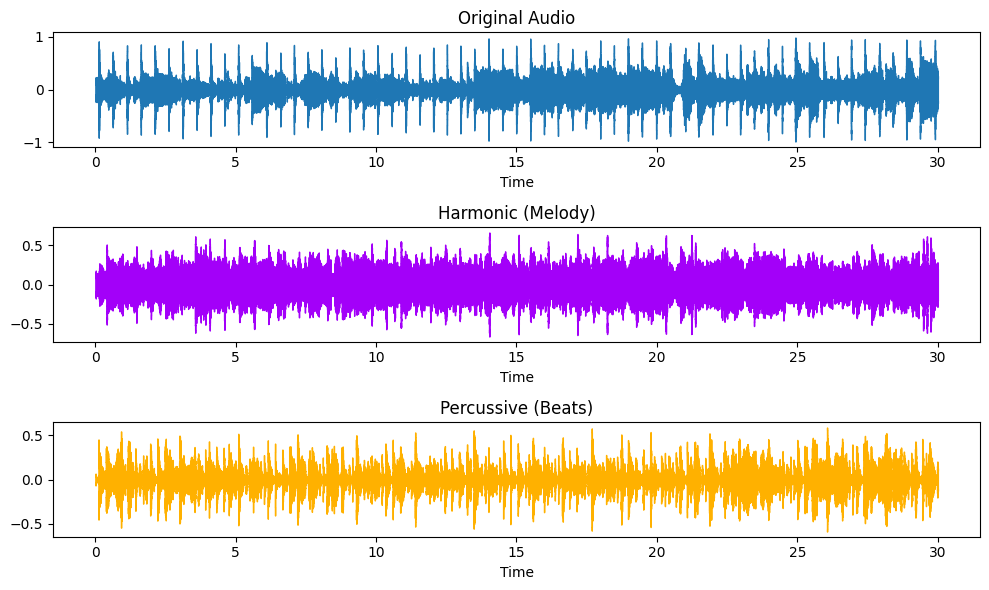

In [ ]:
# Decompose an audio time series into harmonic and percussive components, use librosa.effects.hpss and pass audio_file
y_harm, y_perc =librosa.effects.hpss(audio_file) # code here

# set figure size and plot y_harm and y_perc with color = '#A300F9' & color = '#FFB100'


plt.figure(figsize=(10, 6))

plt.subplot(3, 1, 1)
librosa.display.waveshow(y, sr=sr)
plt.title("Original Audio")

plt.subplot(3, 1, 2)
librosa.display.waveshow(y_harm, sr=sr, color='#A300F9')
plt.title("Harmonic (Melody)")

plt.subplot(3, 1, 3)
librosa.display.waveshow(y_perc, sr=sr, color='#FFB100')
plt.title("Percussive (Beats)")

plt.tight_layout()
plt.show()


#Tempo Beats per minute
Beats are detected in three stages, following the method of:

1. Measure onset strength

2. Estimate tempo from onset correlation

3. Pick peaks in onset strength approximately consistent with estimated tempo

In [ ]:
# use librosa.beat.beat_track and pass y and sr
tempo, _ =librosa.beat.beat_track(y=audio_file,sr=22050) # code here

# print tempo
print(tempo)


[92.28515625]


#Spectral Centroid

In [ ]:
from sklearn.preprocessing import minmax_scale
# Calculate the Spectral Centroids using librosa.feature.spectral_centroid
spectral_centroids =librosa.feature.spectral_centroid(y=audio_file,sr=22050) # code here

# print spectral_centroids
print(spectral_centroids)


# print shape of spectral_centroids

print(spectral_centroids.shape)

# Computing the time variable for visualization
frames = range(spectral_centroids.shape[1]) # code here

# Converts frame counts to time (seconds) using librosa.frame_to_time
t =librosa.frames_to_time(frames, sr=sr) # code here

# print frames

print(frames)
# print t

print(t)
# define function normalize which takes data to normalize and its axis (use minmax_scale from sklearn.preprocessing)
def normalize(x, axis=0):
  return minmax_scale(x, axis=axis)
    # code here

[[3780.20099953 3761.4935154  3660.3491119  ... 3706.32475307
  4220.37165234 4164.87365425]]
(1, 1293)
range(0, 1293)
[0.00000000e+00 2.32199546e-02 4.64399093e-02 ... 2.99537415e+01
 2.99769615e+01 3.00001814e+01]


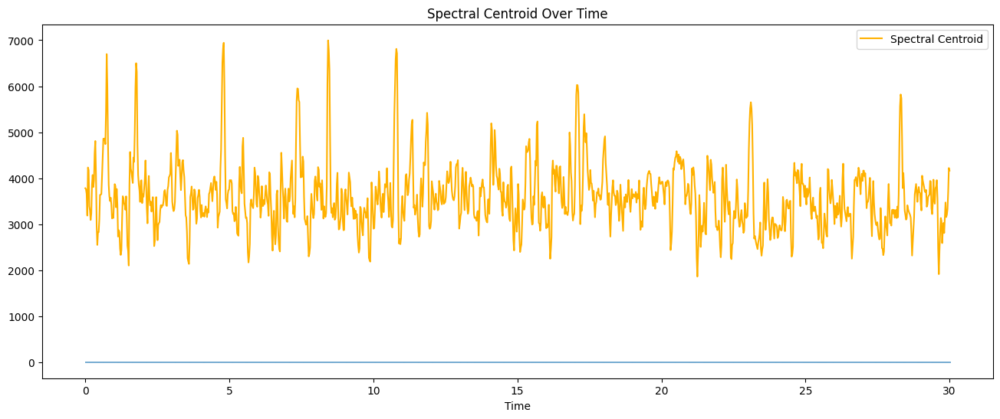

In [ ]:
#Plotting the Spectral Centroid along the waveform
plt.figure(figsize = (16, 6))

# display the waveplot using librosa.display.waveplot

librosa.display.waveshow(y, sr=sr, alpha=0.6)
plt.plot(t, spectral_centroids[0], color="#FFB100", label="Spectral Centroid")
plt.title("Spectral Centroid Over Time")
plt.legend()
plt.show()

# plot by passing t and normalize(spectral_centroids with colot '#FFB100')



# Mel Frequency Cepstral Coefficients (MFCCs) Feature Extraction

**Applications of MFCCs**
* Speech recognition
* Music genre classification
* Music instrument classification

**Properties of MFCCs**
* Capture timbral/textural aspects of sound
* Frequency domain feature
* Approximate human auditory system
* 13 to 40 coefficients
* Calculated at each frame

<a href="https://ibb.co/BsGXxWw"><img src="https://i.ibb.co/kcJRfbM/4.jpg" alt="4" border="0"></a>

(13, 1293)


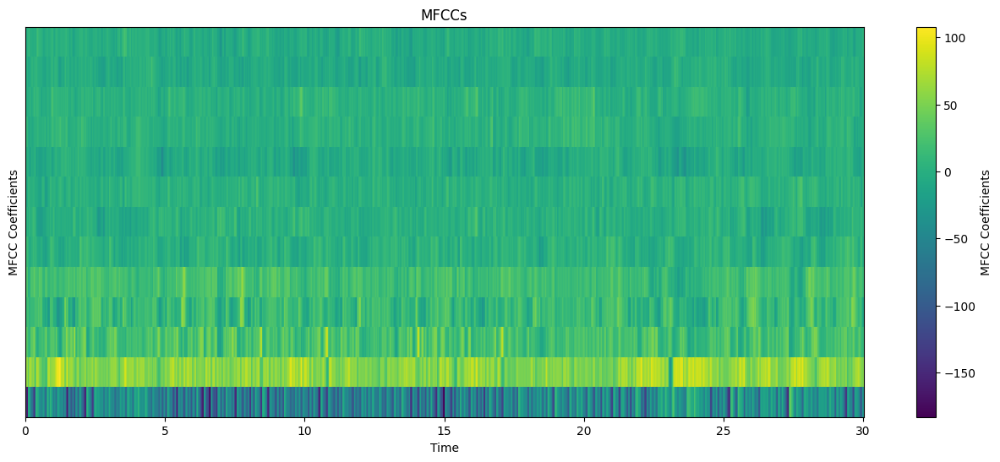

In [ ]:
# Get more components, use librosa.feature.mfcc
mfccs =  librosa.feature.mfcc(y=audio_file, sr=22050, n_mfcc=13)# code here

# print the shape of mfccs
print(mfccs.shape)

#Displaying  the MFCCs:
plt.figure(figsize = (16, 6))
# displaying the MFCCs using librosa.display.specshow

librosa.display.specshow(mfccs, sr=sr, x_axis="time", cmap="viridis")
plt.colorbar(label="MFCC Coefficients")
plt.title("MFCCs")
plt.xlabel("Time")
plt.ylabel("MFCC Coefficients")
plt.show()



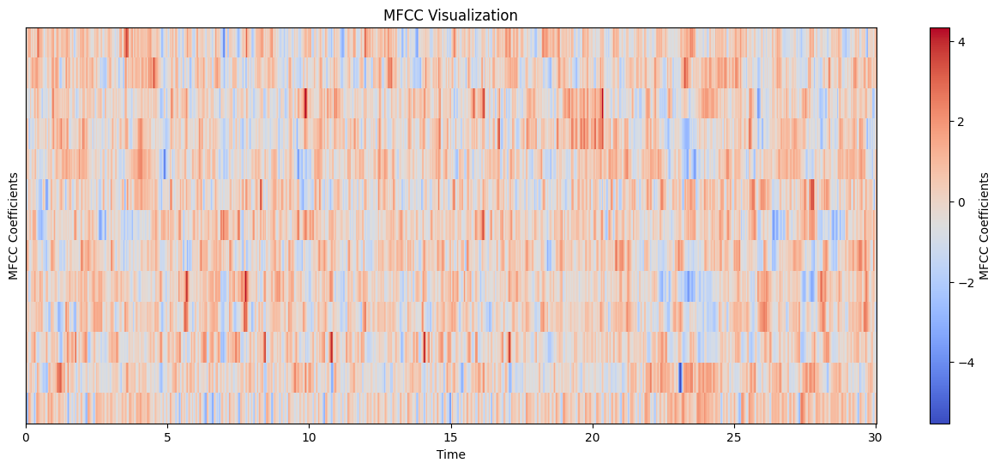

In [ ]:
# Perform Feature Scaling using preprocessing.scale
from sklearn.preprocessing import scale
mfccs = scale(mfccs, axis=1) # code here

# finding the mean of mfccs
mfccs_mean = mfccs.mean()
mfccs_var = mfccs.var()

# finding the variance of mfccs


# setting the figure size
plt.figure(figsize = (16, 6))

# displaying the MFCCs using specshow
librosa.display.specshow(mfccs, x_axis='time')
plt.colorbar(label='MFCC Coefficients')
plt.title('MFCC Visualization')
plt.xlabel('Time')
plt.ylabel('MFCC Coefficients')
plt.show()



#**Exploratory Data Analysis**

In [ ]:
#read the csv file for input dataset f'{general_path}/features_30_sec.csv'
data = pd.read_csv(f'{general_path}/features_30_sec.csv')# code here

#data.head() # check top 5 rows

data.head()



,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


# Lets Create a Correlation HeatMap

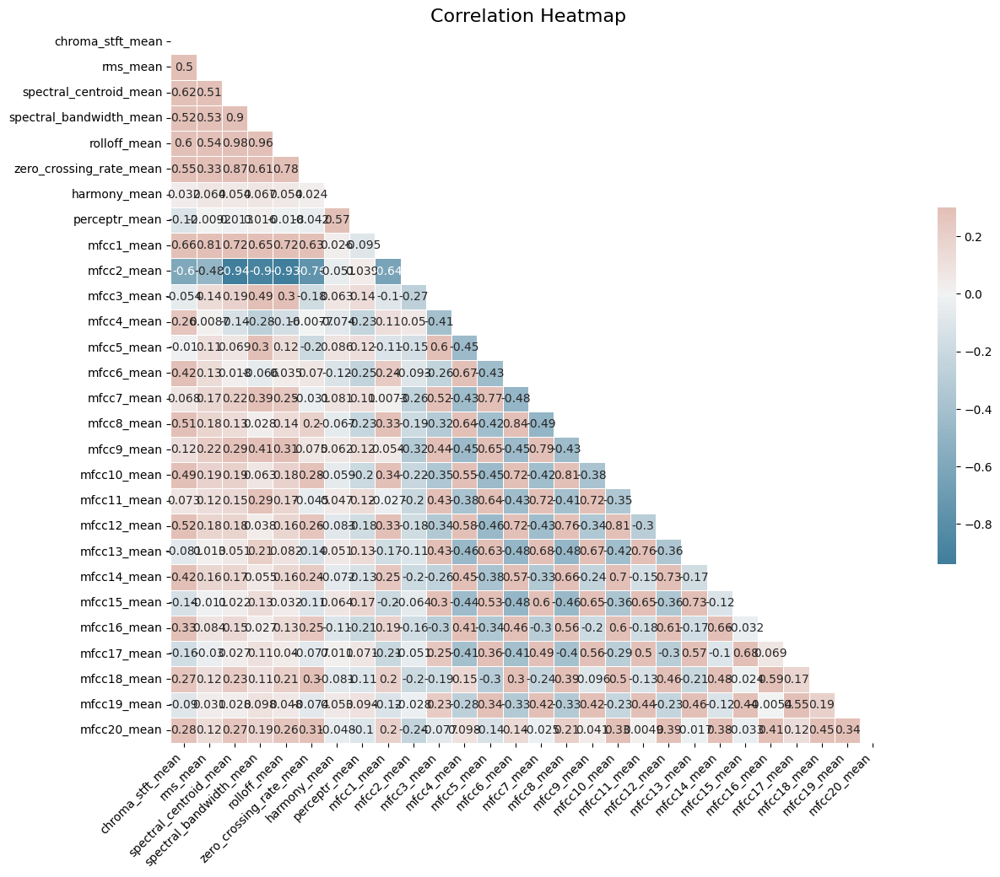

In [ ]:


# Computing the Correlation Matrix
spike_cols = [col for col in data.columns if 'mean' in col]

# apply corr on spike_cols
corr = data[spike_cols].corr()# code here

# Generate a mask for the upper triangle using np.triu
mask =  np.triu(np.ones_like(corr, dtype=bool))# code here

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(16, 11));

# Generate a custom diverging colormap using sns.diverging_palette
cmap = sns.diverging_palette(230, 20, as_cmap=True)# code here

# Draw the heatmap with the mask and correct aspect ratio (vmax=.3, center=0,
            # square=True, linewidths=.5, cbar_kws={"shrink": .5})
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)


# plot the title of graph

plt.title("Correlation Heatmap", fontsize=16)
# Get or set the current tick locations and labels of the x-axis

plt.xticks(rotation=45, ha="right")
# Get or set the current tick locations and labels of the y-axis
plt.yticks(rotation=0)

# save the figure
plt.savefig("Corr Heatmap.jpg")



### Lets make a boxplot based on our classes

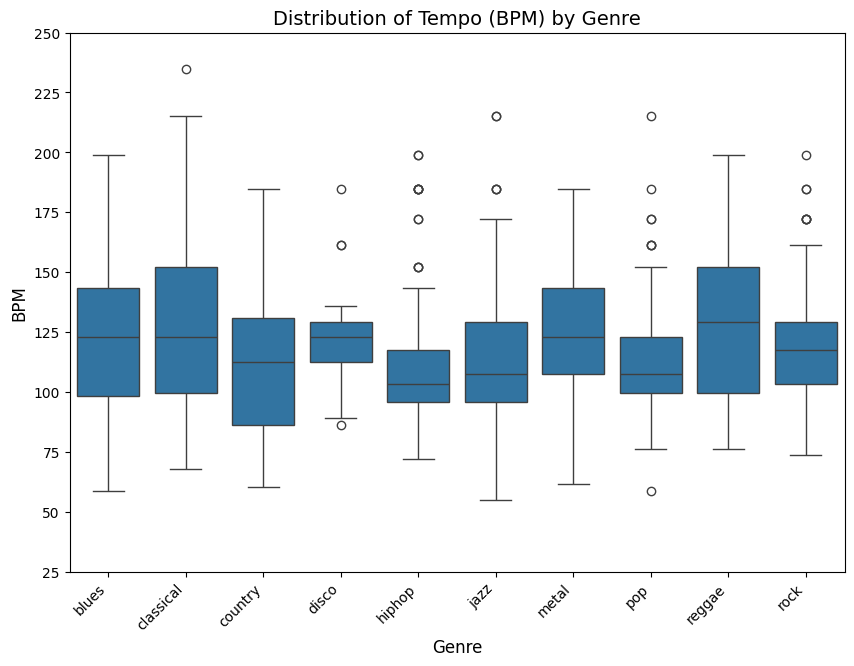

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'label' contains genre/category and 'tempo' contains BPM values
x = data[['label', 'tempo']]

# Create a figure with specific size
f, ax = plt.subplots(figsize=(10, 7))

# Create a boxplot with 'label' on x-axis and 'tempo' on y-axis
sns.boxplot(x='label', y='tempo', data=data, ax=ax)

# Set the title of the graph
ax.set_title("Distribution of Tempo (BPM) by Genre", fontsize=14)

# Set x-axis tick labels (genre names)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

# Set y-axis tick labels
ax.set_yticks(ax.get_yticks())

# Label the x-axis as "Genre"
ax.set_xlabel("Genre", fontsize=12)

# Label the y-axis as "BPM"
ax.set_ylabel("BPM", fontsize=12)

# Save the figure as an image
plt.savefig("BPM_Boxplot.jpg", dpi=300, bbox_inches="tight")

# Show the plot
plt.show()


In [ ]:
# import the sklearn preprocessing library
from sklearn.preprocessing import MinMaxScaler

# taking all rows and columns from 1st using iloc
data = data.iloc[:, 1:]# code here

# set the output feature "label" as y
y = data['label']# code here

# remove label from dataframe as we want to predict the label
X = data.drop(columns=['label'])# code here

# NORMALIZE
#Transform features by scaling each feature to a given range.
#This estimator scales and translates each feature individually such that it is in the given range on the training set, i.e. between zero and one.
cols = X.columns

# use MinMaxScaler to normalize the data
min_max_scaler = MinMaxScaler()# code here

# Fit to data, then transform it.
# Fits transformer to X and y with optional parameters fit_params and returns a transformed version of X.(use fit_transform)
np_scaled = min_max_scaler.fit_transform(X)# code here

# convert np_scaled into dataframe
X =  pd.DataFrame(np_scaled, columns=cols)# code here


#### PCA 2 COMPONENTS ####
from sklearn.decomposition import PCA

# Number of components to keep. if n_components is not set all components are kept:
pca =  PCA(n_components=2)# code here

#Fit and transform the model with X and apply the dimensionality reduction on X.
principalComponents =  pca.fit_transform(X)# code here

# create a dataframe with 2 columns ['principal component 1', 'principal component 2']
principalDf = pd.DataFrame(data=principalComponents, columns=['Principal Component 1', 'Principal Component 2'])# code here

# concatenate with target label
finalDf = pd.concat([principalDf, y.reset_index(drop=True)], axis=1)# code here

# print explained_variance_ratio_ndarray of shape (n_components,)
# Percentage of variance explained by each of the selected components.
# If n_components is not set then all components are stored and the sum of the ratios is equal to 1.0.
print("Explained Variance Ratio:", pca.explained_variance_ratio_)








Explained Variance Ratio: [0.2439355  0.21781804]


## Performing Principal Component Analysis(PCA) on all classes

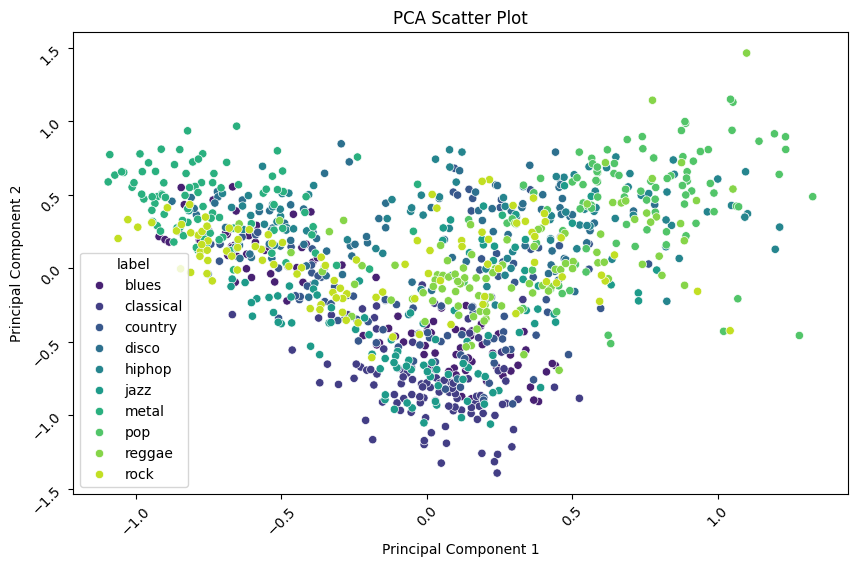

In [ ]:
plt.figure(figsize=(10, 6))

# Plot the scatter plot using seaborn
sns.scatterplot(x=finalDf['Principal Component 1'], y=finalDf['Principal Component 2'], hue=finalDf['label'], palette="viridis")

# Set the title of the graph
plt.title("PCA Scatter Plot")

# Set x-axis and y-axis labels
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")

# Adjust tick labels if needed
plt.xticks(rotation=45)
plt.yticks(rotation=45)

# Save the figure
plt.savefig("PCA_Scatter.jpg")

# Show the plot
plt.show()

#### Import all the classifier models that we are going to use.
#### Import sklearn libraries for measuring accuracy, confusion matrix, auc scores.

In [ ]:
# to perform online updates to model parameters via partial_fit import GaussianNB from sklear.naive_bayes

from sklearn.naive_bayes import GaussianNB
# import SGDClassifier and LogisticRegression

from sklearn.linear_model import SGDClassifier, LogisticRegression
# import k-nearest neighbors from sklearn

from sklearn.neighbors import KNeighborsClassifier
# import Decision Tree Classifier
from sklearn.tree import DecisionTreeClassifier

# import random Forest Classifier using sklearn

from sklearn.ensemble import RandomForestClassifier
# import SVC
from sklearn.svm import SVC

# using sklearn import MLPClassifier

from sklearn.neural_network import MLPClassifier
# import XGB Classifier and XGBRF Classifier

from xgboost import XGBClassifier, XGBRFClassifier
# The XGBoost Python API provides a function for plotting decision trees within a trained XGBoost model.
# import plot_tree, plot_importance
from xgboost import plot_tree, plot_importance

# to plot confusion matrix , accuracy score roc auc score and roc curve using sklearn import necessary libraries
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve

# to preprocess the data using sklearn import preprocessing

from sklearn import preprocessing
# to train test split the data import train_test_split
from sklearn.model_selection import train_test_split

# import RFE
from sklearn.feature_selection import RFE


In [ ]:
# read the cvs file f'{general_path}/features_3_sec.csv', where we have our input dataset
data =pd.read_csv(f'{general_path}/features_3_sec.csv') # code here

# choose all rows and cols from from first to all using iloc method on data
data =data_selected = data.iloc[:, 1:]
 # code here

# display first 5 rows
data.head()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [ ]:
# extract label from data
y = data['label'] # genre variable.

# #select all columns but not the labels
X =  data.drop(columns=['label'])#code here

# NORMALIZE X

# Normalize so everything is on the same scale.

cols = X.columns
min_max_scaler =MinMaxScaler() # code here

# fit transform min_max_scalerand pass X
np_scaled = min_max_scaler.fit_transform(X)# code here

# new data frame with the new scaled data.
X =pd.DataFrame(np_scaled, columns=cols) # code here

# display the top 5 rows
X.head()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
0,0.0,0.355399,0.716757,0.293133,0.107955,0.262173,0.034784,0.459205,0.094130,0.346153,...,0.363613,0.056198,0.397172,0.066062,0.371828,0.055344,0.380831,0.026797,0.506746,0.047781
1,0.0,0.367322,0.670347,0.253040,0.044447,0.270969,0.018716,0.470831,0.052261,0.363722,...,0.468596,0.092912,0.351681,0.074001,0.362068,0.076365,0.418452,0.082414,0.593029,0.065548
2,0.0,0.373159,0.728067,0.296753,0.141663,0.265293,0.023073,0.494051,0.059922,0.378215,...,0.479681,0.096704,0.420979,0.050639,0.400536,0.067509,0.433742,0.043841,0.546264,0.036062
3,0.0,0.399349,0.677066,0.298024,0.075042,0.238427,0.023187,0.455246,0.066234,0.329587,...,0.386258,0.067995,0.387474,0.050617,0.380430,0.050030,0.405824,0.041898,0.562204,0.034873
4,0.0,0.355668,0.689113,0.322308,0.052149,0.233460,0.016451,0.451651,0.047830,0.318453,...,0.438567,0.042500,0.460314,0.083860,0.388590,0.076524,0.409019,0.020763,0.517913,0.031713


In [ ]:
# splitting the data into train and test set with test_size=0.3, random_state=42

from sklearn.model_selection import train_test_split

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)



# **Create a function to fit, predict and print the accuracy of model**

In [ ]:
# create a function to fit the model and predict the result
def model_assess(model, title="Default"):
    # Fit the model with encoded labels
    model.fit(X_train, y_train_encoded)

    # Predict on the test set
    preds = model.predict(X_test)

    # Decode predictions back to original labels
    preds_decoded = label_encoder.inverse_transform(preds)

    # Print accuracy
    print(f'Accuracy {title}:', round(accuracy_score(y_test, preds_decoded), 5), '\n')

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Encode categorical labels into numerical values
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)  # Fit and transform labels
np.save('classes.npy', label_encoder.classes_)

y_test_encoded = label_encoder.transform(y_test)

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier, XGBRFClassifier

# Naive Bayes
nb = GaussianNB()
model_assess(nb, "Naive Bayes")

# Stochastic Gradient Descent (SGD)
sgd = SGDClassifier(random_state=42)
model_assess(sgd, "Stochastic Gradient Descent")

# K-Nearest Neighbors (KNN)
knn = KNeighborsClassifier()
model_assess(knn, "K-Nearest Neighbors")

# Decision Tree
tree = DecisionTreeClassifier(random_state=42)
model_assess(tree, "Decision Tree")

# Random Forest
rforest = RandomForestClassifier(random_state=42)
model_assess(rforest, "Random Forest")

# Support Vector Machine (SVM)
svm = SVC(random_state=42)
model_assess(svm, "Support Vector Machine")

# Logistic Regression
lg = LogisticRegression(max_iter=500, random_state=42)
model_assess(lg, "Logistic Regression")

# Neural Network (MLPClassifier)
nn = MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)
model_assess(nn, "Neural Network")
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
model_assess(xgb, "XGBoost")



# XGBoost Random Forest
xgbrf = XGBRFClassifier(random_state=42)
model_assess(xgbrf, "XGBoost Random Forest")

Accuracy Naive Bayes: 0.51952 

Accuracy Stochastic Gradient Descent: 0.66133 

Accuracy K-Nearest Neighbors: 0.88989 

Accuracy Decision Tree: 0.64965 

Accuracy Random Forest: 0.86553 

Accuracy Support Vector Machine: 0.75409 

Accuracy Logistic Regression: 0.69636 

Accuracy Neural Network: 0.79379 

Accuracy XGBoost: 0.89623 

Accuracy XGBoost Random Forest: 0.74808 



# **Choose the model with best accuracy from above models**

### **Here best model we got is Cross Gradient Booster with an accuracy of 89.623%**

Accuracy: 0.89623 



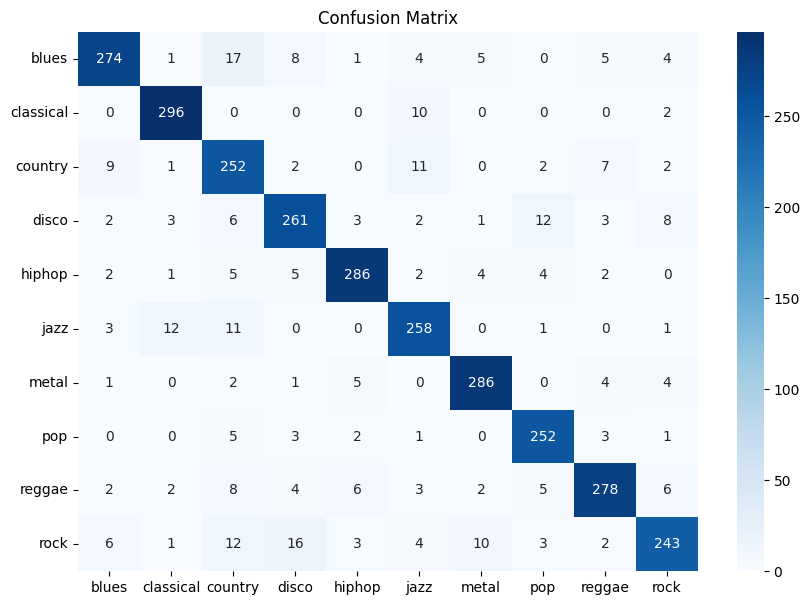

In [ ]:
# Define the XGBoost model
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)

# Fit the model
xgb.fit(X_train, y_train_encoded)  # Using the encoded labels

# Predict
preds_encoded = xgb.predict(X_test)

# Decode predictions back to original labels
preds = label_encoder.inverse_transform(preds_encoded)

# Print accuracy
print('Accuracy:', round(accuracy_score(y_test, preds), 5), '\n')

# Confusion Matrix
confusion_matr = confusion_matrix(y_test, preds, labels=label_encoder.classes_)

# Plot the figure with size 10x7
plt.figure(figsize=(10,7))

# Plot the confusion matrix
sns.heatmap(confusion_matr, cmap="Blues", annot=True,
            xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_,
            fmt='d')

# Set title
plt.title("Confusion Matrix")

# Save the confusion matrix
plt.savefig("conf_matrix.png")

# Show the plot
plt.show()

# **Save the model as txt, json and pkl file**

In [ ]:
# saving the model in json format using save_model method
xgb.save_model("xgb_model.json")



# saving the model in txt format


xgb.save_model("xgb_model.txt")

# importing the pickle file
import pickle
# saving the pickle file with file name
file_name = "xgb.pkl"


# Save the model using pickle
with open(file_name, "wb") as file:
    pickle.dump(xgb, file)



# **loading the model**

In [ ]:
# load the model
import pickle
with open("xgb.pkl", "rb") as file:
    xgb_model = pickle.load(file)

In [ ]:
# Check first row of dataframe X
first_row = X.iloc[0]
first_row

,0
length,0.000000
chroma_stft_mean,0.355399
chroma_stft_var,0.716757
rms_mean,0.293133
rms_var,0.107955
spectral_centroid_mean,0.262173
spectral_centroid_var,0.034784
spectral_bandwidth_mean,0.459205
spectral_bandwidth_var,0.094130
rolloff_mean,0.346153


In [ ]:
# check first 10 output of y_test

y_test.head()

,label
4022,hiphop
5412,jazz
487,blues
39,blues
6795,metal


# **Predicting the model**

In [ ]:
# predict 4th input on X_test

preds = xgb_model.predict(X_test)

# Convert predictions to categorical labels
pred_labels = label_encoder.inverse_transform(preds.astype(int))  # Ensure integers

print(pred_labels[3])

blues


# **Create the function to predict the model**

In [ ]:
def model_predict(data, model):
    # Predict
    preds = model.predict(data)

    # Convert numerical predictions back to original labels (if encoded)
    if isinstance(preds[0], np.integer) or isinstance(preds[0], np.int64):
        from sklearn.preprocessing import LabelEncoder
        label_encoder = LabelEncoder()
        label_encoder.classes_ = np.load('classes.npy', allow_pickle=True)  # Load saved label mappings
        preds = label_encoder.inverse_transform(preds.astype(int))

    return preds



# Lets check the model we created and predict some of test dataset

In [ ]:
# check the predictions for X_test[0]
model_predict(X_test ,xgb_model)[0]

'hiphop'

In [ ]:
# check the predictions for X_test[58]
model_predict(X_test ,xgb_model)[58]



'blues'

In [ ]:
# check the predictions for X_test[75]
model_predict(X_test ,xgb_model)[75]



'country'

In [ ]:
# check the predictions for X_test[46]
model_predict(X_test ,xgb_model)[46]



'disco'

#**Feature Importance**
* Training a model that accurately predicts outcomes is great, but most of the time you don't just need predictions, you want to be able to interpret your model.
* For example, if you build a model of house prices, knowing which features are most predictive of price tells us which features people are willing to pay for.
* Feature importance is the most useful interpretation tool, and data scientists regularly examine model parameters (such as the coefficients of linear models), to identify important features.



A module for computing feature importances by measuring how score decreases when a feature is not available. It contains basic building blocks; there is a full-featured sklearn-compatible implementation in PermutationImportance.

In [ ]:
# install eli5 library
!pip install eli5

     |████████████████████████████████| 106 kB 5.4 MB/s 


* The ELI5 permutation importance takes a much more direct path of determining which features are important against a specific test set by systematically removing them (or more accurately, replacing them with random noise)
and measuring how this affects the model’s performance.  
* It works with both classification and regression models.

100%|===================| 29960/29970 [29:03<00:00]       

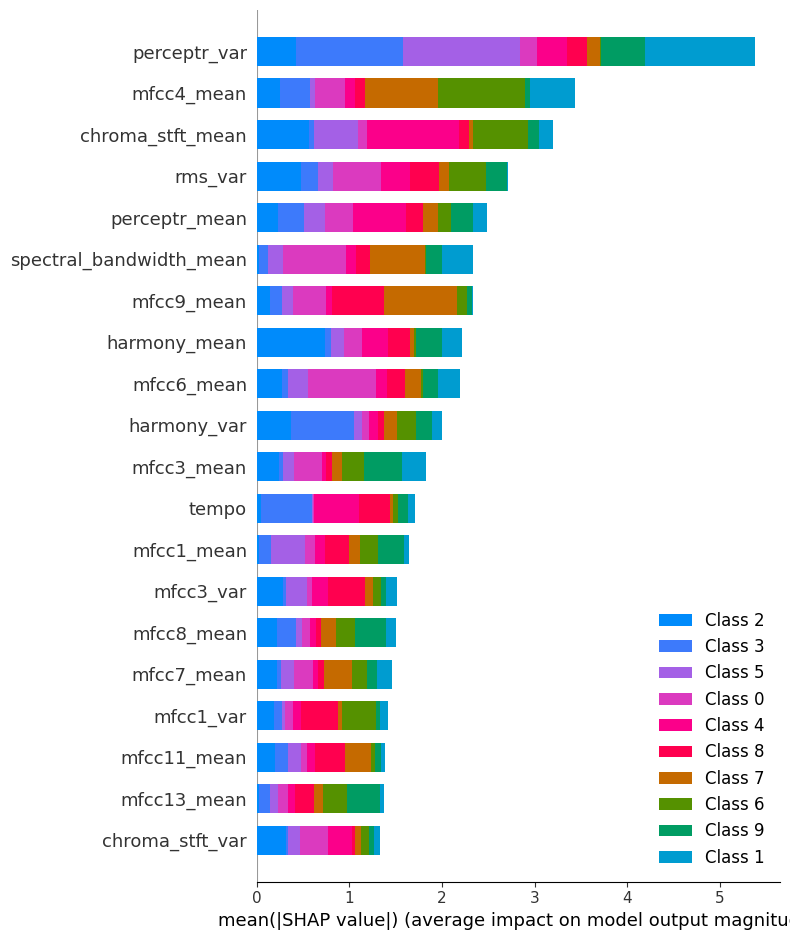

In [ ]:
# import eli5
import shap #eli5 is giving error

# import the PermutationImportance library from eli5.sklearn package

explainer = shap.Explainer(xgb, X_train)
shap_values = explainer(X_test)

# Show summary plot of feature importance
shap.summary_plot(shap_values, X_test) # code here

# **Building the Recommendation System**

In [ ]:
# # importing ipython.display to create an audio object.
import IPython.display as ipd
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Function to play audio
def play_audio(file_path):
    return ipd.Audio(file_path)


# When this object is returned by an input cell or passed to the display function,
# it will result in Audio controls being displayed in the frontend (only works in the notebook).
# import cosine_similarity for recommendations




# import preprocessing



In [ ]:
# Read data f'{general_path}/features_30_sec.csv', index_col='filename'
data = file_path = f"{general_path}/features_30_sec.csv"

# Read the CSV file
data = pd.read_csv(file_path, index_col='filename')# code here

In [ ]:
labels = data['label']

# Drop the 'length' and 'label' columns from the original DataFrame
data = data.drop(columns=['length', 'label'])

# Display the first five rows
data.head()


,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
filename,,,,,,,,,,,,,,,,,,,,,
blues.00000.wav,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,3805.839606,9.015054e+05,...,0.752740,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035
blues.00001.wav,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,3550.522098,2.977893e+06,...,0.927998,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282
blues.00002.wav,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,3042.260232,7.840345e+05,...,2.451690,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025
blues.00003.wav,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,2184.745799,1.493194e+06,...,0.780874,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339
blues.00004.wav,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,3579.757627,1.572978e+06,...,-4.520576,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160


[sklearn.preprocessing.scale](https://scikit-learn.org/stable/modules/classes.html#module-sklearn.preprocessing)

* Standardize a dataset along any axis.
* Center to the mean and component wise scale to unit variance.

In [ ]:
from sklearn.preprocessing import StandardScaler

# Scale the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Print the data type of data_scaled
print(type(data_scaled))




<class 'numpy.ndarray'>


# **Cosine similarity**

[Cosine similarity](https://en.wikipedia.org/wiki/Cosine_similarity)
* It measures the similarity between two vectors of an inner product space.
* It is measured by the cosine of the angle between two vectors and determines whether two vectors are pointing in roughly the same direction.
* It is often used to measure document similarity in text analysis.




In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd

# Instantiate Cosine similarity and pass data_scaled
similarity = cosine_similarity(data_scaled)

# Print the similarity shape
print("Similarity shape:", similarity.shape)

# Convert into a dataframe
sim_df_labels = pd.DataFrame(similarity, index=labels.index)

# Set column names as labels.index
sim_df_names = sim_df_labels.copy()
sim_df_names.columns = labels.index

# Display top 5 rows
sim_df_names.head()


Similarity shape: (1000, 1000)


filename,blues.00000.wav,blues.00001.wav,blues.00002.wav,blues.00003.wav,blues.00004.wav,blues.00005.wav,blues.00006.wav,blues.00007.wav,blues.00008.wav,blues.00009.wav,...,rock.00090.wav,rock.00091.wav,rock.00092.wav,rock.00093.wav,rock.00094.wav,rock.00095.wav,rock.00096.wav,rock.00097.wav,rock.00098.wav,rock.00099.wav
filename,,,,,,,,,,,,,,,,,,,,,
blues.00000.wav,1.000000,0.049231,0.589618,0.284862,0.025561,-0.346688,-0.219483,-0.167626,0.641877,-0.097889,...,-0.082829,0.546169,0.578558,0.662590,0.571629,0.610942,0.640835,0.496294,0.284958,0.304098
blues.00001.wav,0.049231,1.000000,-0.096834,0.520903,0.080749,0.307856,0.318286,0.415258,0.120649,0.404168,...,-0.098111,-0.325126,-0.370792,-0.191698,-0.330834,-0.077301,-0.222119,-0.302573,0.499562,0.311723
blues.00002.wav,0.589618,-0.096834,1.000000,0.210411,0.400266,-0.082019,-0.028061,0.104446,0.468113,-0.132532,...,-0.032408,0.561074,0.590779,0.583293,0.514537,0.495707,0.566837,0.589983,0.216378,0.321069
blues.00003.wav,0.284862,0.520903,0.210411,1.000000,0.126437,0.134796,0.300746,0.324566,0.352758,0.295184,...,-0.320107,-0.206516,-0.151132,0.041986,-0.172515,-0.000287,0.020515,-0.107821,0.502279,0.183210
blues.00004.wav,0.025561,0.080749,0.400266,0.126437,1.000000,0.556066,0.482195,0.623455,0.029703,0.471657,...,0.087605,0.017366,0.138035,0.104684,-0.034594,0.063454,0.063546,0.172944,0.153192,0.061785


In [ ]:



# define find_similar_songs
def find_similar_songs(name):
    # Find songs most similar to another song using sim_df_names[name].sort_values method
    series =sim_df_names[name].sort_values(ascending=False) # code here

    # Remove cosine similarity == 1 (songs will always have the best match with themselves)
    series = series[series < 1]# code here

    # Display the 5 top matches
    print("\n\n We recommend you these songs based on your previous likings and input", name)
    print("\n ")
    # print top 5 songs on the recommendation list i.e. top 5 most similar songs
    print(series.head(5))





In [ ]:
# Enter the song name which you want to get recommendation for (ex pop.00003.wav), use find_similar_song function
find_similar_songs("pop.00003.wav")




 We recommend you these songs based on your previous likings and input pop.00003.wav

 
filename
pop.00003.wav        1.000000
country.00044.wav    0.630061
reggae.00093.wav     0.575888
hiphop.00043.wav     0.569438
hiphop.00059.wav     0.562819
Name: pop.00003.wav, dtype: float64


In [ ]:
# We want to find the recommendation for this song input
ipd.Audio(f'{general_path}/genres_original/pop/pop.00003.wav')

## Predicting the audio recommendations we got above.

In [ ]:
# lets check the recommendations we got.
# recommendation-1
ipd.Audio(f'{general_path}/genres_original/country/country.00003.wav')




In [ ]:
# lets check the recommendations we got.
# recommendation-2
ipd.Audio(f'{general_path}/genres_original/reggae/reggae.00093.wav')


In [ ]:
# lets check the recommendations we got.
# recommendation-3
ipd.Audio(f'{general_path}/genres_original/hiphop/hiphop.00043.wav')


In [ ]:
# lets check the recommendations we got.
# recommendation-4

ipd.Audio(f'{general_path}/genres_original/hiphop/hiphop.00059.wav')